# Topological Data Analysis of Stock Market Indices in Python

In this notebook I follow the analysis outlined by Marian Gidea and Yuri Katz in their paper *Topological Data Analysis of Financial Time Series: Landscapes of Crashes* [[1]](#gidea_topological_2018)

In [1]:
import numpy as np
import pandas as pd
import yfinance as yf

import lib

from plotly.subplots import make_subplots
import plotly.graph_objects as go

# giotto-tda library tools
from gtda.homology import VietorisRipsPersistence
from gtda.time_series import SlidingWindow
#from gtda.time_series import SingleTakensEmbedding
from gtda.plotting import plot_point_cloud, plot_diagram
from gtda.diagrams import Amplitude, PersistenceLandscape

from sklearn.decomposition import PCA

# Parallelism
#import dask
from dask.distributed import Client
import dask.dataframe as dd
import dask.array as da

In [2]:
client = Client(n_workers=16, threads_per_worker=4, memory_limit="8GB")
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 16
Total threads: 64,Total memory: 119.21 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:37301,Workers: 16
Dashboard: http://127.0.0.1:8787/status,Total threads: 64
Started: Just now,Total memory: 119.21 GiB
Comm: tcp://127.0.0.1:42145,Total threads: 4
Dashboard: http://127.0.0.1:34229/status,Memory: 7.45 GiB
Nanny: tcp://127.0.0.1:43331,


In [3]:
data = yf.download(  # or pdr.get_data_yahoo(...
        # tickers list or string as well
        tickers = "^GSPC ^DJI ^IXIC ^RUT ^VIX",

        # use "period" instead of start/end
        # valid periods: 1d,5d,1mo,3mo,6mo,1y,2y,5y,10y,ytd,max
        # (optional, default is '1mo')
        period = "max",

        # fetch data by interval (including intraday if period < 60 days)
        # valid intervals: 1m,2m,5m,15m,30m,60m,90m,1h,1d,5d,1wk,1mo,3mo
        # (optional, default is '1d')
        interval = "1d",
    
        # group by ticker (to access via data['SPY'])
        # (optional, default is 'column')
        #group_by = 'ticker',

        # use threads for mass downloading? (True/False/Integer)
        # (optional, default is True)
        threads = True
    )

[*********************100%%**********************]  5 of 5 completed


In [4]:
# drop any dates for which we don't have complete data
data.dropna(inplace = True)
vol_df = pd.DataFrame(data['Adj Close']['^VIX'])

# Get adjusted closing prices
adj_closes = data['Adj Close'].drop(columns=['^VIX'])
adj_closes

,^DJI,^GSPC,^IXIC,^RUT
Date,,,,
1992-01-02,3172.399902,417.260010,586.450012,188.750000
1992-01-03,3201.500000,419.339996,592.650024,192.089996
1992-01-06,3200.100098,417.959991,597.900024,194.330002
1992-01-07,3204.800049,417.399994,602.289978,195.770004
1992-01-08,3203.899902,418.100006,610.320007,198.080002
...,...,...,...,...
2023-08-14,35307.628906,4489.720215,13788.330078,1920.489990
2023-08-15,34946.390625,4437.859863,13631.049805,1895.750000
2023-08-16,34765.738281,4404.330078,13474.629883,1871.520020


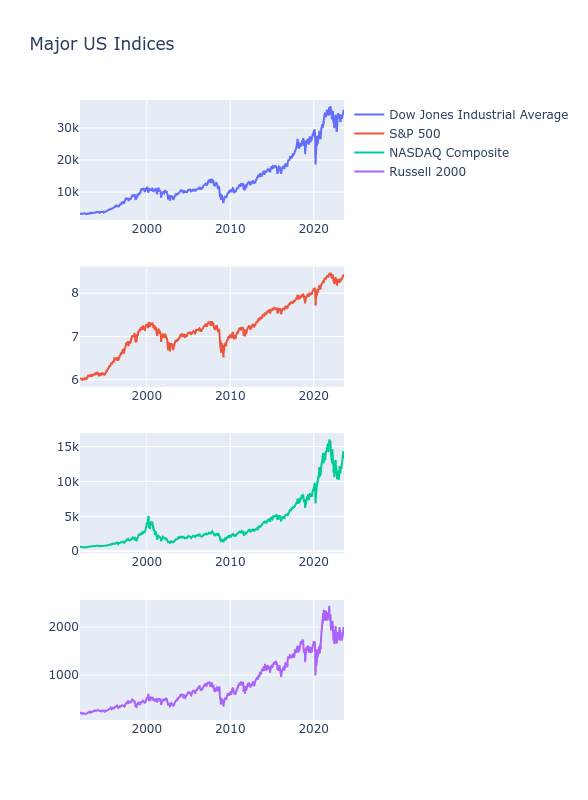

In [5]:
fig = make_subplots(rows=4, cols=1)

# Add traces
fig.append_trace(
    go.Scatter(x=adj_closes.index, y=adj_closes['^DJI'], name='Dow Jones Industrial Average'),
    row=1, col=1
)
fig.append_trace(
    go.Scatter(x=adj_closes.index, y=np.log(adj_closes['^GSPC']), name='S&P 500'),
    row=2, col=1
)
fig.append_trace(
    go.Scatter(x=adj_closes.index, y=adj_closes['^IXIC'], name='NASDAQ Composite'),
    row=3, col=1
)
fig.append_trace(
    go.Scatter(x=adj_closes.index, y=adj_closes['^RUT'], name='Russell 2000'),
    row=4, col=1
)
fig.update_layout(height=800, width=960, title_text="Major US Indices")
fig.show()

In [6]:
log_returns = lib.calc_logreturns(adj_closes)
log_returns.tail()

,^DJI,^GSPC,^IXIC,^RUT
Date,,,,
2023-08-14,0.000743,0.005734,0.010460,-0.002403
2023-08-15,-0.010284,-0.011618,-0.011472,-0.012966
2023-08-16,-0.005183,-0.007584,-0.011542,-0.012864
2023-08-17,-0.008403,-0.007743,-0.011773,-0.011533
2023-08-18,0.000749,-0.000149,-0.001966,0.005047


Now we need to set a window size *w*, defining a point cloud of *w* points at each time *t*.

In [7]:
# cast to an n x 4 matrix
data = log_returns.to_numpy()
w = 50

In [8]:
# Giotto-tda has a Sliding Window class but I decided to use ndarray indexing to roll my own
point_clouds = lib.sliding_window(log_returns, w)
point_clouds.shape

(7917, 50, 4)

In [9]:
# Using the class provided by giotto-tda
windows = SlidingWindow(size=w)
point_clouds2 = windows.fit_transform(log_returns)

# This should be true if both methods produce the same ndarray
assert(np.equal(point_clouds, point_clouds2).all())


Now that we've constructed our 4-dimensional point clouds, let's use PCA to do some dimension reduction and get a rough idea of what one of them looks like.


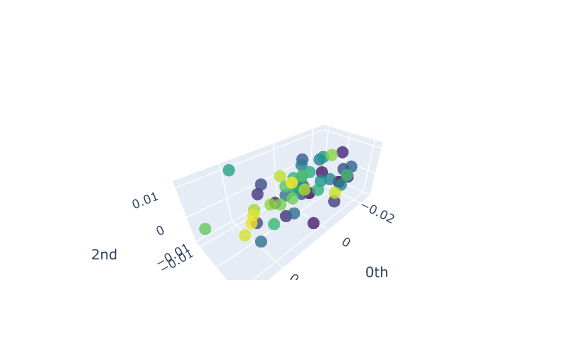

In [10]:
i = point_clouds.shape[0] - 1
pca = PCA(n_components=3)
point_cloud_pca = pca.fit_transform(point_clouds[i])
plot_point_cloud(point_cloud_pca)

Now comes one of the central ideas of topological data analysis.  We use a filtration of Vietoris-Rips complexes to calculate the (1-dimensional) persistent homology of our point clouds.

In [11]:
VR = VietorisRipsPersistence(homology_dimensions = [1], n_jobs = -1)
diagrams = VR.fit_transform(point_clouds)
diagrams.shape

(7917, 17, 3)

In [12]:
diagrams[i]

array([[0.01029267, 0.01080649, 1.        ],
       [0.00996752, 0.01126424, 1.        ],
       [0.00951581, 0.01095471, 1.        ],
       [0.009097  , 0.00911562, 1.        ],
       [0.00862636, 0.00864385, 1.        ],
       [0.00843199, 0.00957885, 1.        ],
       [0.00802568, 0.01081416, 1.        ],
       [0.00762976, 0.00911562, 1.        ],
       [0.00756051, 0.00908171, 1.        ],
       [0.00729834, 0.00777285, 1.        ],
       [0.00714425, 0.00879811, 1.        ],
       [0.00685978, 0.00958184, 1.        ],
       [0.00659305, 0.00700593, 1.        ],
       [0.00646142, 0.00728861, 1.        ],
       [0.00134559, 0.00134559, 1.        ],
       [0.00134559, 0.00134559, 1.        ],
       [0.00134559, 0.00134559, 1.        ]])

A persistence diagram is a collection of (birth, death) ordered pairs representing the emergence and disappearance of topological features as we increase the allowed distance between connected points (and simplexes) in the Vietoris-Rips complex.  A graphical representation of the above diagram is below.  In this case, since we are looking at the 1-dimensional persistent homology, the topological features we are looking at can be thought of as 1-dimensional holes, i.e. loops.

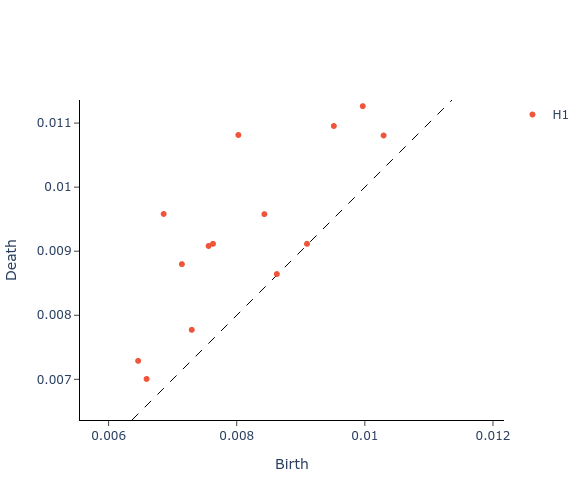

In [13]:
plot_diagram(diagrams[i])

A persistence landscape is a way of transforming a persistence diagram into a form that is easier to work with.  In particular, the norm associated with a persistence landscape exists in a space with "nice" mathematical properties for the purposes of statistics and machine learning (a Banach space).

In [14]:
# We calculate the L1 and L2 norms of the persistence landscapes associated with our diagrams
L1_norms = Amplitude(metric='landscape', metric_params={'p':1}).fit_transform(diagrams)
L2_norms = Amplitude(metric='landscape', metric_params={'p':2}).fit_transform(diagrams)

# Now we put them in the columns of a dataframe indexed by date
norm_arr = np.hstack((L1_norms, L2_norms))
date_index = log_returns[(w - 1):].index

norm_df = pd.DataFrame(norm_arr, index = date_index, columns=['L1', 'L2'])
norm_df.tail()

,L1,L2
Date,,
2023-08-14,0.000004,0.000057
2023-08-15,0.000004,0.000057
2023-08-16,0.000004,0.000057
2023-08-17,0.000004,0.000057
2023-08-18,0.000004,0.000057


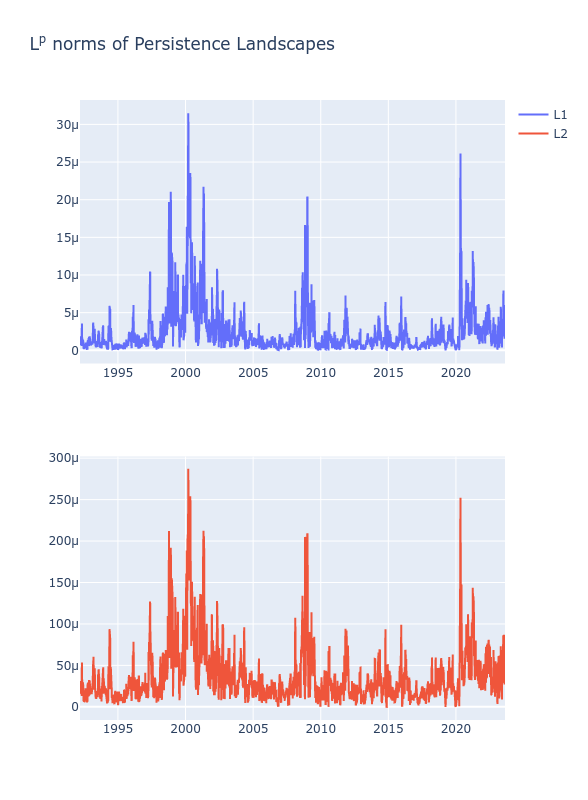

In [15]:
# Finally, we can graph the norms of the persistence landscapes over time
fig = make_subplots(rows=2, cols=1)

# Add traces
fig.append_trace(
    go.Scatter(x=norm_df.index, y=norm_df['L1'], name='L1'),
    row=1, col=1
)
fig.append_trace(
    go.Scatter(x=norm_df.index, y=norm_df['L2'], name='L2'),
    row=2, col=1
)
fig.update_layout(height=800, width=1280, title_text="L<sup>p</sup> norms of Persistence Landscapes")
fig.show()

We can see that the $L^p$ norms spike in March 2000, late 2008 to early 2009, and late April through early May of 2020.  These correspond the the Dot-com bubble, Global Financial Crisis, and COVID-19 Pandemic.  While only the spike leading up to the height of the Dot-com bubble seems to have been early enough to be an effective warning sign, these results are interesting nonetheless, as it shows these norms could be used to measure market volatility in a way that is not directly related to VIX.

In [16]:
window_size = 500
subwindow_size = 250

# Define a window corresponding to the (250 + subwindow_size - 1) trading days prior to March 10, 2000
# I expanded the window at the beginning so that I can compute metrics 
# on sliding sub-windows starting at the very first observation

norms_dotcom_expanded = norm_df.loc[:'2000-03-10'][-(window_size+subwindow_size):-1]
norms_dotcom = norms_dotcom_expanded[subwindow_size-1:]

vol_dotcom = vol_df.loc[:'2000-03-10'][-(window_size+1):-1]

max_freq = 1/subwindow_size

In [17]:
dndf = dd.from_pandas(norm_df, chunksize=subwindow_size)
dndf

,L1,L2
npartitions=32,,
1992-03-13,float64,float64
1993-03-10,...,...
...,...,...
2022-12-19,...,...
2023-08-18,...,...


In [18]:
%%time
power = dndf.rolling(subwindow_size).apply(lambda s: lib.low_pass_pgram(s, max_freq=max_freq)[1].mean())

CPU times: user 3.66 ms, sys: 0 ns, total: 3.66 ms
Wall time: 3.61 ms


In [19]:
%%time
power_computed = power.compute()

CPU times: user 7.32 s, sys: 2.77 s, total: 10.1 s
Wall time: 1min 13s


In [20]:
spec_index = norm_df.index[(subwindow_size - 1):]

In [21]:
# This should be true if spec_index is in fact the index of all rows with a computed power spectrum
norm_df[power_computed.notna().all(axis=1)].index.equals(spec_index)

True

In [22]:
df = vol_df.join(norm_df, validate="one_to_one")
df.columns = pd.MultiIndex.from_product([df.columns, ['Value']])

dotcom_index = df.loc[:'2000-03-10'][-(window_size+1):-1].index
df.loc[dotcom_index]

,^VIX,L1,L2
,Value,Value,Value
Date,,,
1998-03-18,18.290001,0.000002,0.000029
1998-03-19,17.760000,0.000002,0.000029
1998-03-20,18.690001,0.000002,0.000029
1998-03-23,19.980000,0.000002,0.000029
1998-03-24,20.510000,0.000001,0.000027
...,...,...,...
2000-03-03,19.209999,0.000022,0.000208
2000-03-06,21.500000,0.000020,0.000205


In [23]:
df.loc[spec_index, ('L1', 'Spectrum')] = power_computed.loc[spec_index,'L1']
df.loc[spec_index, ('L2', 'Spectrum')] = power_computed.loc[spec_index,'L2']
df.loc[spec_index]

,^VIX,L1,L2,L1,L2
,Value,Value,Value,Spectrum,Spectrum
Date,,,,,
1993-03-09,14.170000,0.000003,0.000046,0.358633,0.306623
1993-03-10,13.910000,0.000002,0.000045,0.369767,0.320523
1993-03-11,14.260000,0.000002,0.000045,0.385232,0.337551
1993-03-12,15.660000,0.000003,0.000061,0.397385,0.351753
1993-03-15,14.740000,0.000003,0.000061,0.410059,0.365910
...,...,...,...,...,...
2023-08-14,14.820000,0.000004,0.000057,0.122048,0.092729
2023-08-15,16.459999,0.000004,0.000057,0.122560,0.092937


In [24]:
#L = lib.sliding_window(norm_df, subwindow_size)
#np.apply_along_axis(lambda s: np.var(s), 1, L)

In [25]:
df.loc[spec_index].xs('Spectrum', axis=1, level=1)

,L1,L2
Date,,
1993-03-09,0.358633,0.306623
1993-03-10,0.369767,0.320523
1993-03-11,0.385232,0.337551
1993-03-12,0.397385,0.351753
1993-03-15,0.410059,0.365910
...,...,...
2023-08-14,0.122048,0.092729
2023-08-15,0.122560,0.092937
2023-08-16,0.123116,0.093394


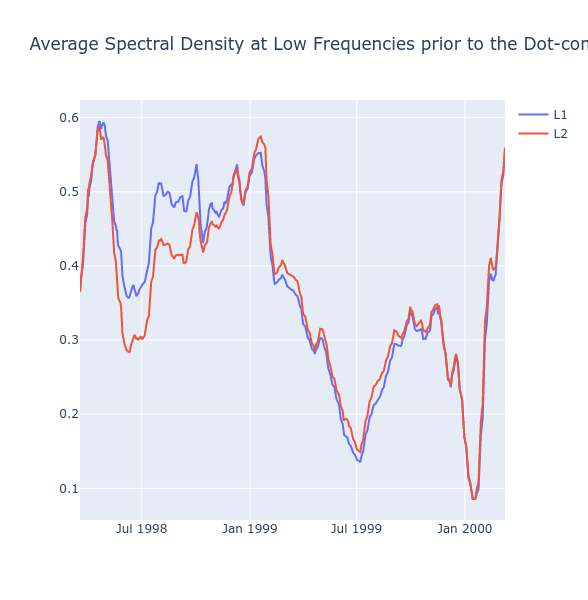

In [26]:
lib.line_charts(df.loc[dotcom_index].xs('Spectrum', axis=1, level=1),
                "Average Spectral Density at Low Frequencies prior to the Dot-com Crash", height=600, width=800, subplots=False)

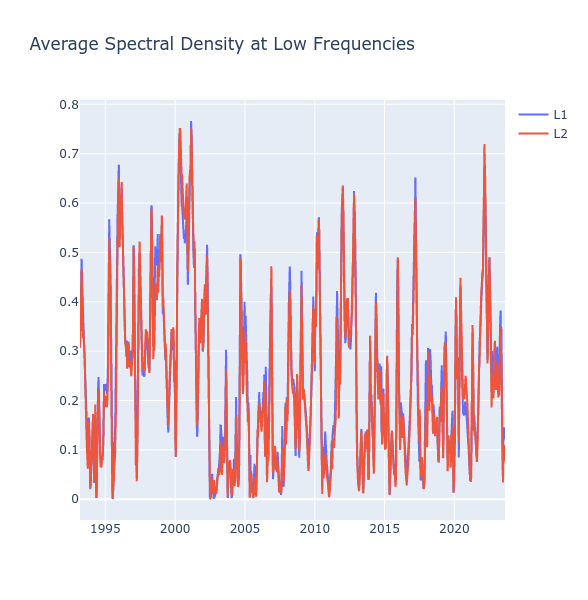

In [27]:
lib.line_charts(df.loc[spec_index].xs('Spectrum', axis=1, level=1),
                "Average Spectral Density at Low Frequencies", height=600, width=800, subplots=False)

## References

<a id='gidea_topological_2018'></a>
[1] M. Gidea and Y. Katz, “Topological Data Analysis of Financial Time Series: Landscapes of Crashes,” Physica A: Statistical Mechanics and its Applications, vol. 491, pp. 820–834, Feb. 2018, doi: [10.1016/j.physa.2017.09.028](https://doi.org/10.1016/j.physa.2017.09.028).